$$
\newcommand{\mat}[1]{\boldsymbol {#1}}
\newcommand{\mattr}[1]{\boldsymbol {#1}^\top}
\newcommand{\matinv}[1]{\boldsymbol {#1}^{-1}}
\newcommand{\vec}[1]{\boldsymbol {#1}}
\newcommand{\vectr}[1]{\boldsymbol {#1}^\top}
\newcommand{\rvar}[1]{\mathrm {#1}}
\newcommand{\rvec}[1]{\boldsymbol{\mathrm{#1}}}
\newcommand{\diag}{\mathop{\mathrm {diag}}}
\newcommand{\set}[1]{\mathbb {#1}}
\newcommand{\norm}[1]{\left\lVert#1\right\rVert}
\newcommand{\pderiv}[2]{\frac{\partial #1}{\partial #2}}
\newcommand{\bm}[1]{{\bf #1}}
\newcommand{\bb}[1]{\bm{\mathrm{#1}}}
$$

# Part 2: Generative Adversarial Networks
<a id=part3></a>

In this part we will implement and train a generative adversarial network and apply it to the task of image generation.

In [1]:
import unittest
import os
import sys
import pathlib
import urllib
import shutil
import re
import zipfile

import numpy as np
import torch
import matplotlib.pyplot as plt

%load_ext autoreload
%autoreload 2

test = unittest.TestCase()
plt.rcParams.update({'font.size': 12})
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Using device:', device)

Using device: cuda


### Obtaining the dataset
<a id=part3_1></a>

Let's begin by downloading a dataset of images that we want to learn to generate. 
We'll use the [Labeled Faces in the Wild](http://vis-www.cs.umass.edu/lfw/) (LFW) dataset which contains many labeled faces of famous individuals.

We're going to train our generative model to generate a specific face, not just any face.
Since the person with the most images in this dataset is former president George W. Bush, we'll set out to train a Bush Generator :)

However, if you feel adventurous and/or prefer to generate something else, feel free to edit the `PART2_CUSTOM_DATA_URL` variable in `hw3/answers.py`.


You can use a custom dataset, by editing the `PART3_CUSTOM_DATA_URL` variable in `hw3/answers.py`, and get a bonus!

In [2]:
import cs236781.plot as plot
import cs236781.download
from hw3.answers import PART3_CUSTOM_DATA_URL as CUSTOM_DATA_URL

DATA_DIR = pathlib.Path.home().joinpath('.pytorch-datasets')
if CUSTOM_DATA_URL is None:
    DATA_URL = 'http://vis-www.cs.umass.edu/lfw/lfw-bush.zip'
else:
    DATA_URL = CUSTOM_DATA_URL

_, dataset_dir = cs236781.download.download_data(out_path=DATA_DIR, url=DATA_URL, extract=True, force=False)

File C:\Users\kingh\.pytorch-datasets\George_W_Bush2.zip exists, skipping download.
Extracting C:\Users\kingh\.pytorch-datasets\George_W_Bush2.zip...
Extracted 532 to C:\Users\kingh\.pytorch-datasets\George_W_Bush/George_W_Bush


Create a `Dataset` object that will load the extraced images:

In [3]:
import torchvision.transforms as T
from torchvision.datasets import ImageFolder

im_size = 64
tf = T.Compose([
    # Resize to constant spatial dimensions
    T.Resize((im_size, im_size)),
    # PIL.Image -> torch.Tensor
    T.ToTensor(),
    # Dynamic range [0,1] -> [-1, 1]
    T.Normalize(mean=(.5,.5,.5), std=(.5,.5,.5)),
])

ds_gwb = ImageFolder(os.path.dirname(dataset_dir), tf)

OK, let's see what we got. You can run the following block multiple times to display a random subset of images from the dataset.

Found 530 images in dataset folder.


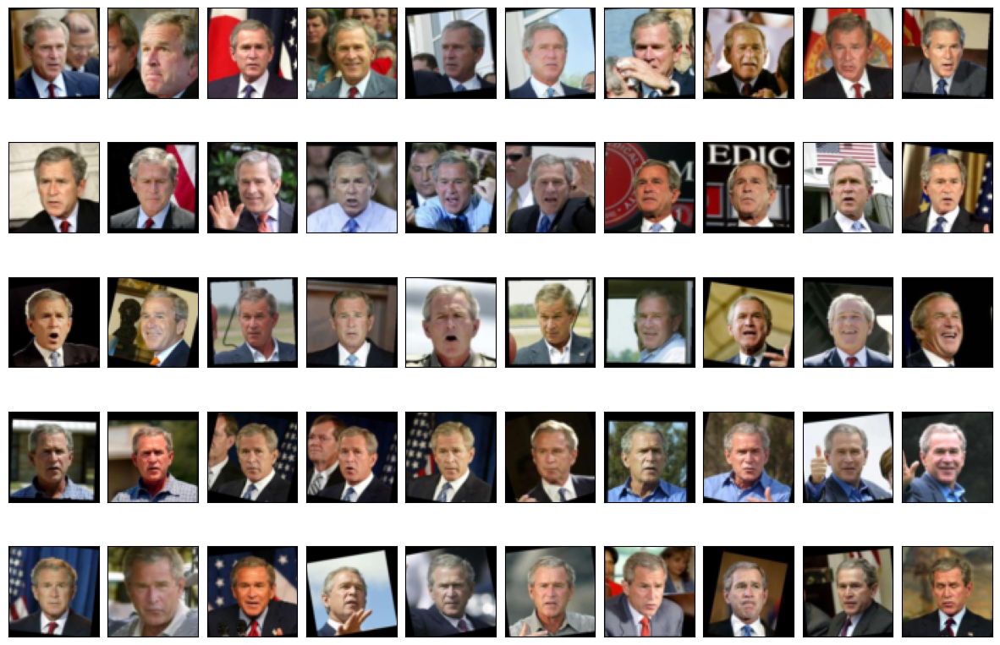

In [4]:
_ = plot.dataset_first_n(ds_gwb, 50, figsize=(15,10), nrows=5)
print(f'Found {len(ds_gwb)} images in dataset folder.')

In [5]:
x0, y0 = ds_gwb[0]
x0 = x0.unsqueeze(0).to(device)
print(x0.shape)

test.assertSequenceEqual(x0.shape, (1, 3, im_size, im_size))

torch.Size([1, 3, 64, 64])


## Generative Adversarial Nets (GANs)
<a id=part3_2></a>

GANs, first proposed in a [paper](https://arxiv.org/pdf/1406.2661.pdf) by Ian Goodfellow in 2014 are today arguably the most popular type of generative model. GANs are currently producing state of the art
results in generative tasks over many different domains.

In a GAN model, two different neural networks compete against each other: A **generator** and a **discriminator**.

- The Generator, which we'll denote as $\Psi _{\bb{\gamma}} : \mathcal{U} \rightarrow \mathcal{X}$, maps a latent-space variable
$\bb{u}\sim\mathcal{N}(\bb{0},\bb{I})$ to an instance-space variable $\bb{x}$ (e.g. an image).
Thus a parametric evidence distribution $p_{\bb{\gamma}}(\bb{X})$ is generated,
which we typically would like to be as close as possible to the real evidence distribution, $p(\bb{X})$.

- The Discriminator, $\Delta _{\bb{\delta}} : \mathcal{X} \rightarrow [0,1]$, is a network which,
given an instance-space variable $\bb{x}$, returns the  probability that $\bb{x}$ is real, i.e. that $\bb{x}$
was sampled from $p(\bb{X})$ and not $p_{\bb{\gamma}}(\bb{X})$.


<img src="imgs/gan.jpg" />

### Training GANs
<a id=part3_3></a>

The generator is trained to generate "fake" instances which will maximally fool the
discriminator into returning that they're real. Mathematically, the generator's parameters
$\bb{\gamma}$ should be chosen such as to **maximize** the expression
$$
\mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) )).
$$

The discriminator is trained to classify between real images, coming from the training set,
and fake images generated by the generator.
Mathematically, the discriminator's parameters $\bb{\delta}$ should be chosen such as to
**maximize** the expression
$$
\mathbb{E} _{\bb{x} \sim p(\bb{X}) } \log \Delta _{\bb{\delta}}(\bb{x})  \, + \,
\mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (1-\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) )).
$$

These two competing objectives can thus be expressed as the following min-max optimization:
$$
\min _{\bb{\gamma}} \max _{\bb{\delta}} \,
\mathbb{E} _{\bb{x} \sim p(\bb{X}) } \log \Delta _{\bb{\delta}}(\bb{x})  \, + \,
\mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (1-\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) )).
$$

A key insight into GANs is that we can interpret the above maximum as the *loss* with respect to
$\bb{\gamma}$:

$$
L({\bb{\gamma}}) =
\max _{\bb{\delta}} \, \mathbb{E} _{\bb{x} \sim p(\bb{X}) } \log \Delta _{\bb{\delta}}(\bb{x})  \, + \,
  \mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (1-\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) )).
$$

This means that the generator's loss function trains together with the generator
itself in an adversarial manner. In contrast, when training our VAE we used a fixed L2 norm
as a data loss term.

### Model Implementation
<a id=part3_4></a>

We'll now implement a Deep Convolutional GAN (DCGAN) model.
See the DCGAN [paper](https://arxiv.org/pdf/1511.06434.pdf) for architecture ideas and tips for training.

**TODO**: Implement the `Discriminator` class in the `hw3/gan.py` module.
If you wish you can reuse the `EncoderCNN` class from the VAE model as the first part of the Discriminator.

In [6]:
import hw3.gan as gan

dsc = gan.Discriminator(in_size=x0[0].shape).to(device)
print(dsc)

d0 = dsc(x0)
print(d0.shape)

test.assertSequenceEqual(d0.shape, (1,1))

Discriminator(
  (cnn): Sequential(
    (0): Conv2d(3, 64, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.9, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.01)
    (3): Conv2d(64, 128, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2))
    (4): BatchNorm2d(128, eps=1e-05, momentum=0.9, affine=True, track_running_stats=True)
    (5): LeakyReLU(negative_slope=0.01)
    (6): Conv2d(128, 256, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2))
    (7): BatchNorm2d(256, eps=1e-05, momentum=0.9, affine=True, track_running_stats=True)
    (8): LeakyReLU(negative_slope=0.01)
  )
  (fully_connected_layer): Linear(in_features=16384, out_features=1, bias=True)
)
torch.Size([1, 1])


**TODO**: Implement the `Generator` class in the `hw3/gan.py` module.
If you wish you can reuse the `DecoderCNN` class from the VAE model as the last part of the Generator.

In [7]:
z_dim = 128
gen = gan.Generator(z_dim, 4).to(device)
print(gen)

z = torch.randn(1, z_dim).to(device)
xr = gen(z)
print(xr.shape)

test.assertSequenceEqual(x0.shape, xr.shape)

Generator(
  (fc): Linear(in_features=128, out_features=16384, bias=False)
  (generator): Sequential(
    (0): ConvTranspose2d(1024, 512, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (1): BatchNorm2d(512, eps=1e-06, momentum=0.9, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.01)
    (3): ConvTranspose2d(512, 256, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2), output_padding=(1, 1))
    (4): BatchNorm2d(256, eps=1e-06, momentum=0.9, affine=True, track_running_stats=True)
    (5): LeakyReLU(negative_slope=0.01)
    (6): ConvTranspose2d(256, 128, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2), output_padding=(1, 1))
    (7): BatchNorm2d(128, eps=1e-06, momentum=0.9, affine=True, track_running_stats=True)
    (8): LeakyReLU(negative_slope=0.01)
    (9): ConvTranspose2d(128, 64, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2), output_padding=(1, 1))
    (10): BatchNorm2d(64, eps=1e-06, momentum=0.9, affine=True, track_running_stats=True)
    (

### Loss Implementation
<a id=part3_5></a>

Let's begin with the discriminator's loss function.
Based on the above we can flip the sign and say we want to update the 
Discriminator's parameters $\bb{\delta}$ so that they **minimize** the expression
$$
- \mathbb{E} _{\bb{x} \sim p(\bb{X}) } \log \Delta _{\bb{\delta}}(\bb{x})  \, - \,
\mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (1-\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) )).
$$

We're using the Discriminator twice in this expression;
once to classify data from the real data distribution and
once again to classify generated data.
Therefore our loss should be computed based on these two terms.
Notice that since the discriminator returns a probability, we can formulate the above as two cross-entropy losses.

GANs are notoriously diffucult to train.
One common trick for improving GAN stability during training is to make the classification labels noisy for the discriminator. This can be seen as a form of regularization, to help prevent the discriminator from overfitting.

We'll incorporate this idea into our loss function. Instead of labels being equal to 0 or 1, we'll make them
"fuzzy", i.e. random numbers in the ranges $[0\pm\epsilon]$ and $[1\pm\epsilon]$.

**TODO**: Implement the `discriminator_loss_fn()` function in the `hw3/gan.py` module.

In [8]:
from hw3.gan import discriminator_loss_fn
torch.manual_seed(42)

y_data = torch.rand(10) * 10
y_generated = torch.rand(10) * 10

loss = discriminator_loss_fn(y_data, y_generated, data_label=1, label_noise=0.3)
print(loss)

test.assertAlmostEqual(loss.item(), 6.4808731, delta=1e-5)


tensor(6.4809)


Similarly, the generator's parameters $\bb{\gamma}$ should **minimize** the expression
$$
-\mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) ))
$$

which can also be seen as a cross-entropy term. This corresponds to "fooling" the discriminator; Notice that the gradient of the loss w.r.t $\bb{\gamma}$ using this expression also depends on $\bb{\delta}$.

**TODO**: Implement the `generator_loss_fn()` function in the `hw3/gan.py` module.

In [9]:
from hw3.gan import generator_loss_fn
torch.manual_seed(42)

y_generated = torch.rand(20) * 10

loss = generator_loss_fn(y_generated, data_label=1)
print(loss)

test.assertAlmostEqual(loss.item(), 0.0222969, delta=1e-3)

tensor(0.0223)


### Sampling
<a id=part3_6></a>

Sampling from a GAN is straightforward, since it learns to generate data from an isotropic Gaussian latent space distribution.

There is an important nuance however. Sampling is required during the process of training the GAN, since
we generate fake images to show the discriminator.
As you'll seen in the next section,  in some cases we'll need our samples to have gradients (i.e., to be part of
the Generator's computation graph).

**TODO**: Implement the `sample()` method in the `Generator` class within the `hw3/gan.py` module.

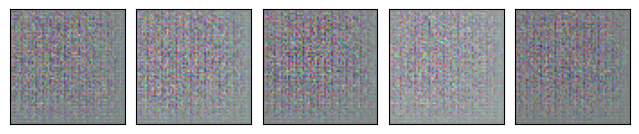

In [10]:
samples = gen.sample(5, with_grad=False)
test.assertSequenceEqual(samples.shape, (5, *x0.shape[1:]))
test.assertIsNone(samples.grad_fn)
_ = plot.tensors_as_images(samples.cpu())

samples = gen.sample(5, with_grad=True)
test.assertSequenceEqual(samples.shape, (5, *x0.shape[1:]))
test.assertIsNotNone(samples.grad_fn)

### Training
<a id=part3_7></a>

Training GANs is a bit different since we need to train two models simultaneously, each with it's own separate loss function and optimizer. We'll implement the training logic as a function that handles one batch of data
and updates both the discriminator and the generator based on it.

As mentioned above, GANs are considered hard to train. To get some ideas and tips you can see this [paper](https://arxiv.org/pdf/1606.03498.pdf), this list of ["GAN hacks"](https://github.com/soumith/ganhacks) or just do it the hard way :)

**TODO**:
1. Implement the `train_batch` function in the `hw3/gan.py` module.
2. Tweak the hyperparameters in the `part3_gan_hyperparams()` function within the `hw3/answers.py` module.

In [11]:
import torch.optim as optim
from torch.utils.data import DataLoader
from hw3.answers import part3_gan_hyperparams

torch.manual_seed(42)

# Hyperparams
hp = part3_gan_hyperparams()
batch_size = hp['batch_size']
z_dim = hp['z_dim']

# Data
dl_train = DataLoader(ds_gwb, batch_size, shuffle=True)
im_size = ds_gwb[0][0].shape

# Model
dsc = gan.Discriminator(im_size).to(device)
gen = gan.Generator(z_dim, featuremap_size=4).to(device)

# Optimizer
def create_optimizer(model_params, opt_params):
    opt_params = opt_params.copy()
    optimizer_type = opt_params['type']
    opt_params.pop('type')
    return optim.__dict__[optimizer_type](model_params, **opt_params)
dsc_optimizer = create_optimizer(dsc.parameters(), hp['discriminator_optimizer'])
gen_optimizer = create_optimizer(gen.parameters(), hp['generator_optimizer'])

# Loss
def dsc_loss_fn(y_data, y_generated):
    return gan.discriminator_loss_fn(y_data, y_generated, hp['data_label'], hp['label_noise'])

def gen_loss_fn(y_generated):
    return gan.generator_loss_fn(y_generated, hp['data_label'])

# Training
checkpoint_file = 'checkpoints/gan'
checkpoint_file_final = f'{checkpoint_file}_final'
if os.path.isfile(f'{checkpoint_file}.pt'):
    os.remove(f'{checkpoint_file}.pt')

# Show hypers
print(hp)

{'batch_size': 8, 'z_dim': 100, 'data_label': 1, 'label_noise': 0.2, 'learn_rate': 0.0002, 'discriminator_optimizer': {'type': 'Adam', 'lr': 0.0002}, 'generator_optimizer': {'type': 'Adam', 'lr': 0.0002}}


**TODO**:
1. Implement the `save_checkpoint` function in the `hw3.gan` module. You can decide on your own criterion regarding whether to save a checkpoint at the end of each epoch.
1. Run the following block to train. It will sample some images from your model every few epochs so you can see the progress.
2. When you're satisfied with your results, rename the checkpoints file by adding `_final`. When you run the `main.py` script to generate your submission, the final checkpoints file will be loaded instead of running training. Note that your final submission zip will not include the `checkpoints/` folder. This is OK.

--- EPOCH 1/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:06<00:00, 10.47it/s]
Discriminator loss: 0.18410165741372464
Generator loss:     5.5369274189223106
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


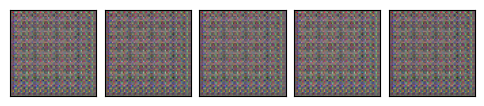

--- EPOCH 2/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 20.40it/s]
Discriminator loss: 0.10391607474702508
Generator loss:     7.530620240453464
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


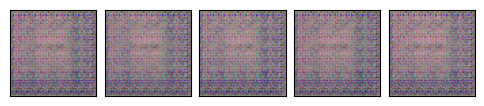

--- EPOCH 3/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 20.79it/s]
Discriminator loss: 0.14573944385038384
Generator loss:     7.739350874032548
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


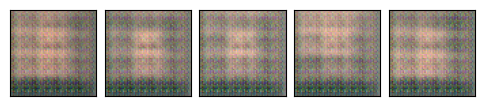

--- EPOCH 4/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 20.38it/s]
Discriminator loss: 0.10102511575417732
Generator loss:     7.023636782347267
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


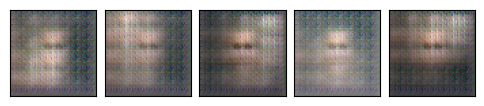

--- EPOCH 5/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 20.82it/s]
Discriminator loss: 0.1480524879115731
Generator loss:     6.168306009093327
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


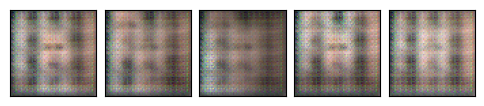

--- EPOCH 6/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 20.56it/s]
Discriminator loss: 0.14771615880638805
Generator loss:     7.430092477086765
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


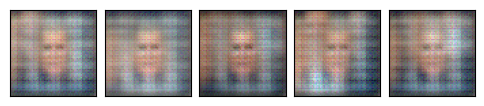

--- EPOCH 7/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 19.15it/s]
Discriminator loss: 0.11120316742071465
Generator loss:     7.211161538736144
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


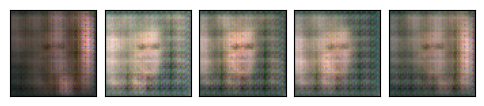

--- EPOCH 8/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 19.73it/s]
Discriminator loss: 0.18509693710661645
Generator loss:     7.499383236045268
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


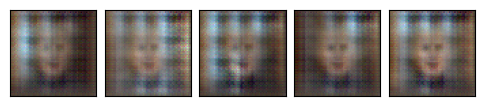

--- EPOCH 9/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 20.66it/s]
Discriminator loss: 0.15031949302821018
Generator loss:     6.675218663998504
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


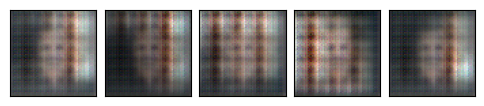

--- EPOCH 10/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 19.58it/s]
Discriminator loss: 0.19048447100751437
Generator loss:     6.934470511194485
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


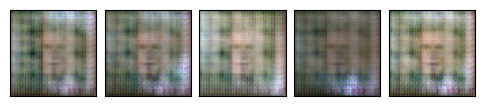

--- EPOCH 11/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 20.07it/s]
Discriminator loss: 0.08759175168711748
Generator loss:     7.476777211943669
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


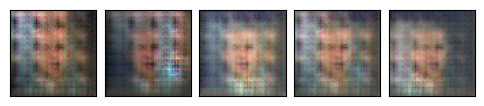

--- EPOCH 12/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 19.18it/s]
Discriminator loss: 0.13071800440327444
Generator loss:     6.472379417561773
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


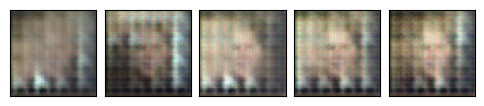

--- EPOCH 13/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 20.37it/s]
Discriminator loss: 0.1410762995147883
Generator loss:     6.640631924814253
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


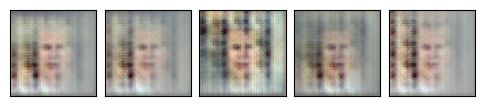

--- EPOCH 14/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 20.67it/s]
Discriminator loss: 0.13629588406922213
Generator loss:     6.231057031830745
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


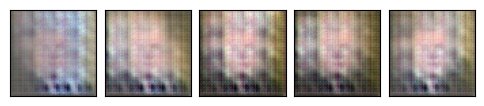

--- EPOCH 15/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 20.59it/s]
Discriminator loss: 0.13173403051584515
Generator loss:     5.683882635031173
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


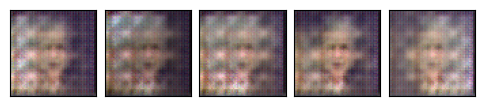

--- EPOCH 16/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 20.48it/s]
Discriminator loss: 0.11719827276112428
Generator loss:     7.086935673187028
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


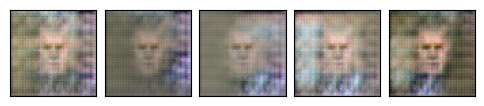

--- EPOCH 17/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 20.85it/s]
Discriminator loss: 0.132943536780441
Generator loss:     8.020734865274003
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


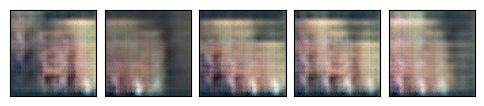

--- EPOCH 18/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 20.78it/s]
Discriminator loss: 0.1353533021660883
Generator loss:     7.152885497505985
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


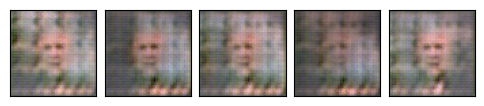

--- EPOCH 19/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 20.59it/s]
Discriminator loss: 0.15866431215805793
Generator loss:     7.624214489068558
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


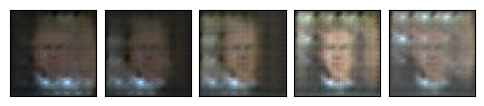

--- EPOCH 20/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 20.55it/s]
Discriminator loss: 0.10791549787147721
Generator loss:     7.45998054120078
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


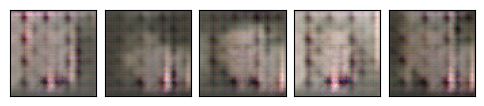

--- EPOCH 21/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 20.73it/s]
Discriminator loss: 0.07716446617312396
Generator loss:     7.768929058046483
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


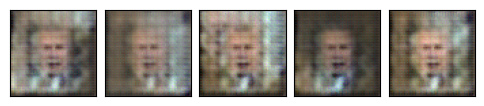

--- EPOCH 22/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 20.81it/s]
Discriminator loss: 0.10732138704564144
Generator loss:     6.431745151975262
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


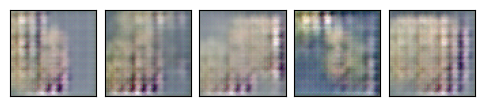

--- EPOCH 23/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 20.72it/s]
Discriminator loss: 0.0627246746487582
Generator loss:     8.33684877139419
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


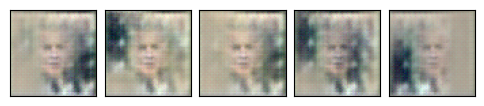

--- EPOCH 24/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 20.63it/s]
Discriminator loss: 0.11811177666062739
Generator loss:     8.240620212768441
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


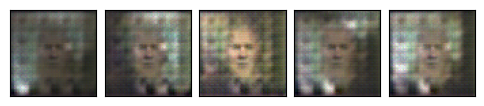

--- EPOCH 25/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 20.68it/s]
Discriminator loss: 0.24802935518213173
Generator loss:     7.692132017505703
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


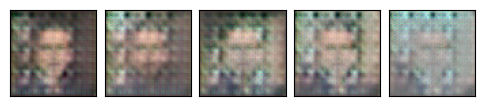

--- EPOCH 26/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 20.59it/s]
Discriminator loss: 0.1730087995251168
Generator loss:     7.851143705311106
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


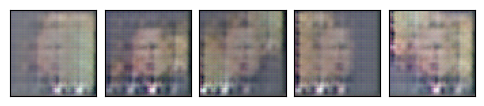

--- EPOCH 27/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 19.85it/s]
Discriminator loss: 0.032211777490021576
Generator loss:     7.5359421310140124
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


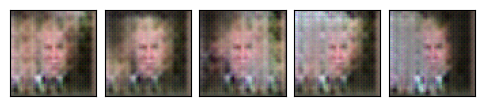

--- EPOCH 28/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 20.71it/s]
Discriminator loss: 0.1728400949444344
Generator loss:     8.484154469931303
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


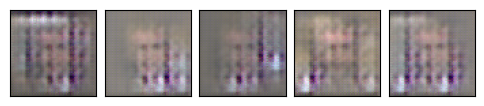

--- EPOCH 29/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 20.37it/s]
Discriminator loss: 0.20681864612582904
Generator loss:     6.965319256284344
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


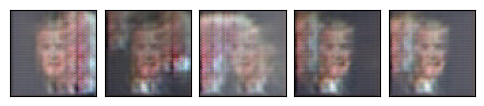

--- EPOCH 30/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 20.43it/s]
Discriminator loss: 0.14446738462394743
Generator loss:     7.0629114215053725
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


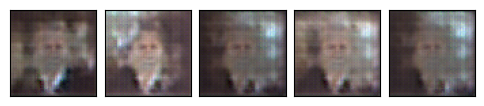

--- EPOCH 31/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 20.08it/s]
Discriminator loss: 0.2619073011203488
Generator loss:     7.36193856196617
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


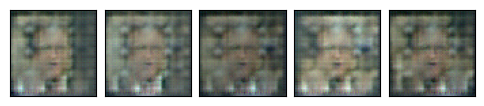

--- EPOCH 32/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 20.32it/s]
Discriminator loss: 0.05634118605460694
Generator loss:     8.324685715917331
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


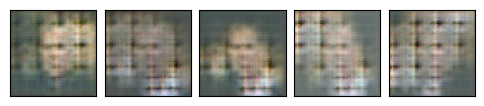

--- EPOCH 33/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 20.67it/s]
Discriminator loss: 0.12107384221544906
Generator loss:     6.631397119208948
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


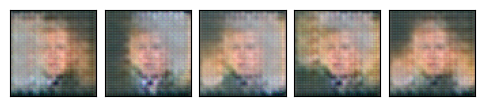

--- EPOCH 34/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 20.52it/s]
Discriminator loss: 0.1068235162589977
Generator loss:     8.921632329029823
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


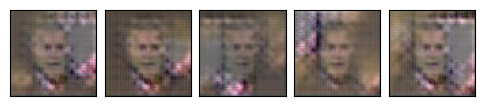

--- EPOCH 35/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 20.47it/s]
Discriminator loss: 0.1651120387684943
Generator loss:     7.577301694386041
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


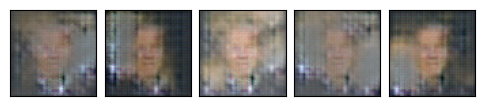

--- EPOCH 36/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 20.65it/s]
Discriminator loss: 0.20582876279394127
Generator loss:     6.803399605537528
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


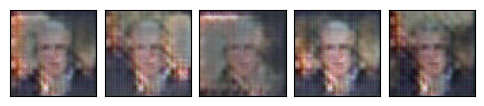

--- EPOCH 37/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 20.37it/s]
Discriminator loss: 0.1244820764482911
Generator loss:     6.065445771857874
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


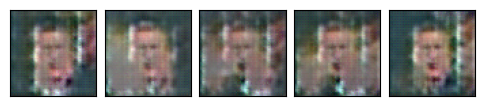

--- EPOCH 38/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 20.25it/s]
Discriminator loss: 0.13446944145791567
Generator loss:     6.6359103935868
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


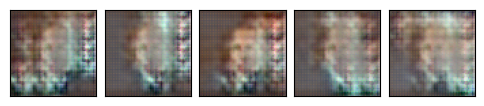

--- EPOCH 39/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 19.78it/s]
Discriminator loss: 0.200785759947638
Generator loss:     7.442390467693556
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


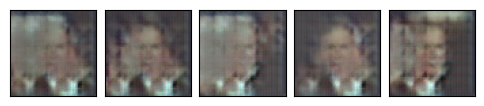

--- EPOCH 40/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 20.12it/s]
Discriminator loss: 0.14784756806025753
Generator loss:     7.573184127238259
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


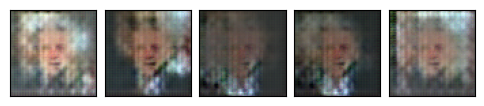

--- EPOCH 41/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 20.28it/s]
Discriminator loss: 0.10604812026913486
Generator loss:     6.494525172817173
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


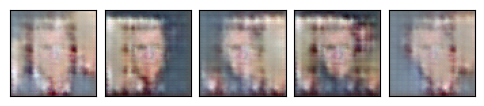

--- EPOCH 42/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 20.20it/s]
Discriminator loss: 0.1159031041967335
Generator loss:     5.938196015002123
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


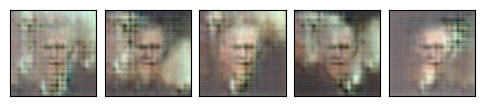

--- EPOCH 43/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 20.14it/s]
Discriminator loss: 0.2427878753462834
Generator loss:     7.403681299579677
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


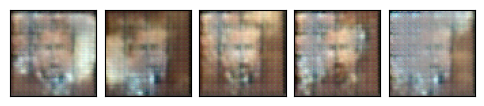

--- EPOCH 44/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 20.10it/s]
Discriminator loss: 0.0761986964785341
Generator loss:     7.993095600782936
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


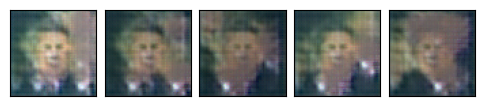

--- EPOCH 45/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 20.31it/s]
Discriminator loss: 0.1488242593607796
Generator loss:     6.413933522665679
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


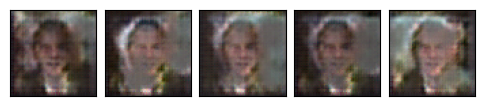

--- EPOCH 46/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 20.25it/s]
Discriminator loss: 0.0757461492139012
Generator loss:     6.571411221774657
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


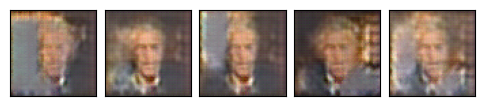

--- EPOCH 47/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 20.48it/s]
Discriminator loss: 0.20717345467254297
Generator loss:     6.831976417285293
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


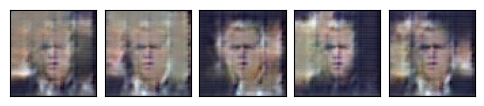

--- EPOCH 48/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 20.39it/s]
Discriminator loss: 0.07341141920925966
Generator loss:     6.5997596000557515
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


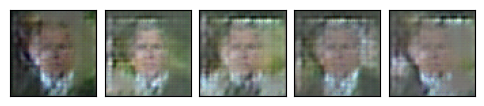

--- EPOCH 49/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 20.45it/s]
Discriminator loss: 0.19218391371863103
Generator loss:     7.1296993654165695
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


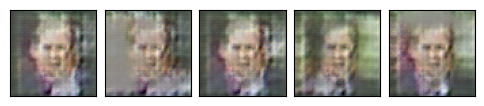

--- EPOCH 50/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 19.96it/s]
Discriminator loss: 0.09648943611823801
Generator loss:     7.326938899595346
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


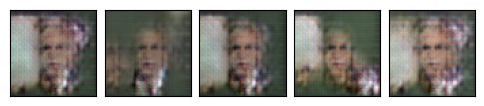

--- EPOCH 51/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 20.34it/s]
Discriminator loss: 0.16398658764673701
Generator loss:     7.132593863045991
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


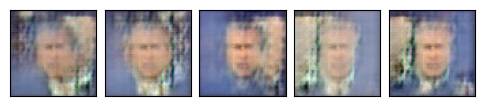

--- EPOCH 52/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 20.37it/s]
Discriminator loss: 0.11521336508553419
Generator loss:     7.31314039942044
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


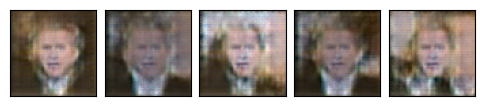

--- EPOCH 53/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 20.47it/s]
Discriminator loss: 0.06336360130069861
Generator loss:     6.9275609059120296
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


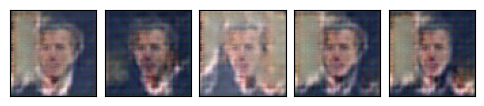

--- EPOCH 54/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 20.43it/s]
Discriminator loss: 0.07449264404600237
Generator loss:     6.878505158780226
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


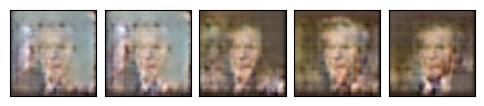

--- EPOCH 55/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 20.25it/s]
Discriminator loss: 0.1464992494169456
Generator loss:     7.607619890526159
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


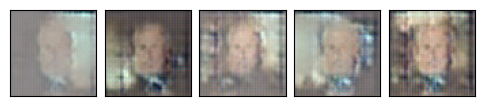

--- EPOCH 56/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 20.21it/s]
Discriminator loss: 0.06113258137631772
Generator loss:     7.415182967684162
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


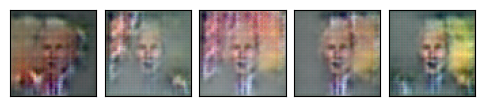

--- EPOCH 57/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 19.86it/s]
Discriminator loss: 0.1272628292886179
Generator loss:     8.147631542006536
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


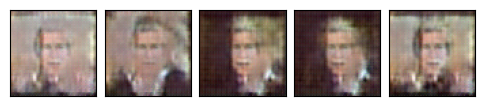

--- EPOCH 58/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 19.26it/s]
Discriminator loss: 0.11990695724736398
Generator loss:     7.021860247227683
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


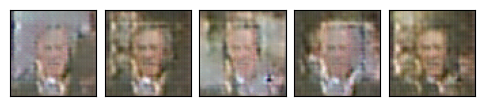

--- EPOCH 59/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 19.57it/s]
Discriminator loss: 0.1909594211949786
Generator loss:     8.496940192891591
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


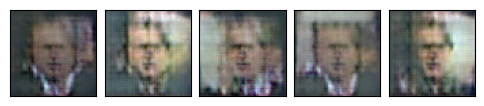

--- EPOCH 60/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 19.45it/s]
Discriminator loss: 0.10572715142547194
Generator loss:     6.792815123031389
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


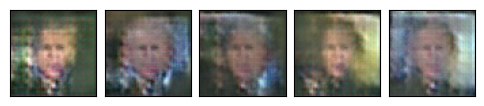

--- EPOCH 61/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 19.39it/s]
Discriminator loss: 0.09519409446685172
Generator loss:     7.197817741934933
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


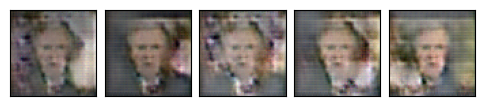

--- EPOCH 62/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 19.97it/s]
Discriminator loss: 0.14555460342497967
Generator loss:     7.146658107415954
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


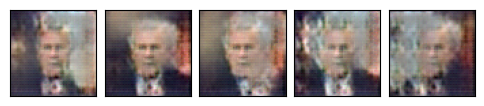

--- EPOCH 63/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 18.76it/s]
Discriminator loss: 0.13503346472644984
Generator loss:     6.0250018390256965
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


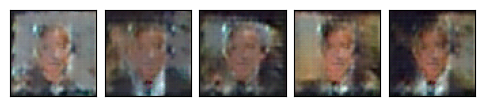

--- EPOCH 64/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 18.77it/s]
Discriminator loss: 0.09228937566947581
Generator loss:     7.137567046862929
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


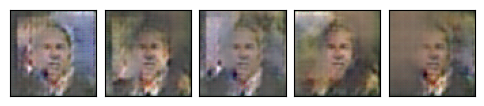

--- EPOCH 65/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 19.30it/s]
Discriminator loss: 0.17176163933281577
Generator loss:     6.456476510460697
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


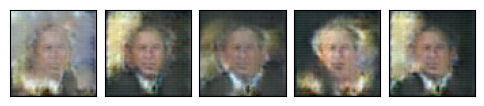

--- EPOCH 66/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 19.95it/s]
Discriminator loss: 0.19271761445856805
Generator loss:     8.122796265046988
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


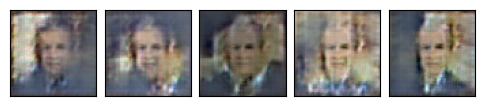

--- EPOCH 67/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 19.70it/s]
Discriminator loss: 0.1453669073977577
Generator loss:     6.253144349624861
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


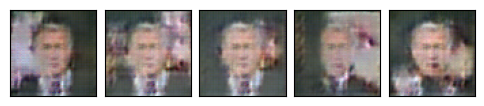

--- EPOCH 68/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 19.80it/s]
Discriminator loss: 0.09822238386789364
Generator loss:     6.8781451680767
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


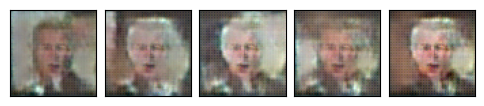

--- EPOCH 69/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 19.63it/s]
Discriminator loss: 0.08095119176293487
Generator loss:     5.992929501319999
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


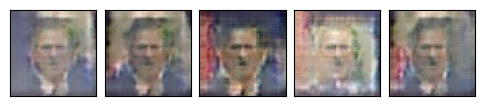

--- EPOCH 70/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 19.32it/s]
Discriminator loss: 0.11174563034924108
Generator loss:     6.490134271223154
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


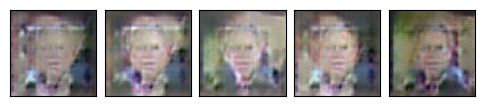

--- EPOCH 71/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 17.01it/s]
Discriminator loss: 0.11624109044448654
Generator loss:     6.510092340298553
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


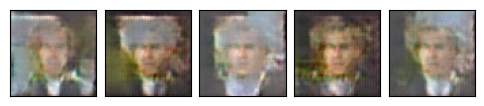

--- EPOCH 72/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 19.36it/s]
Discriminator loss: 0.09325499832630157
Generator loss:     6.940369880021508
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


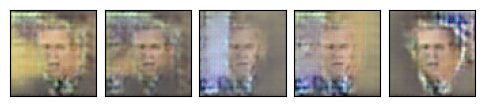

--- EPOCH 73/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 19.43it/s]
Discriminator loss: 0.23517991413376224
Generator loss:     6.933995129457161
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


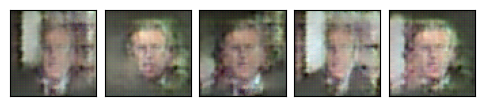

--- EPOCH 74/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 19.58it/s]
Discriminator loss: 0.12290609728044538
Generator loss:     6.890364995643274
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


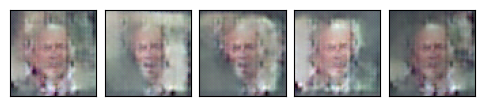

--- EPOCH 75/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 19.27it/s]
Discriminator loss: 0.09656724508907367
Generator loss:     7.316093686801284
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


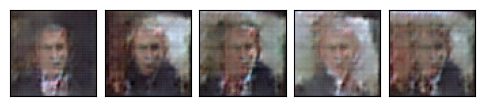

--- EPOCH 76/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 19.01it/s]
Discriminator loss: 0.2091336372628141
Generator loss:     6.390241898707489
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


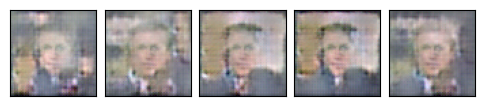

--- EPOCH 77/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 19.20it/s]
Discriminator loss: 0.11999999981985163
Generator loss:     6.720690633823622
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


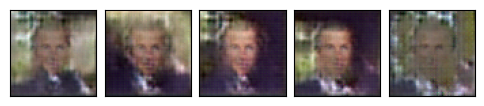

--- EPOCH 78/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 19.66it/s]
Discriminator loss: 0.13612069253490042
Generator loss:     6.270915006523702
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


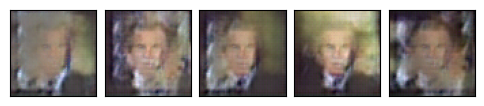

--- EPOCH 79/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 18.93it/s]
Discriminator loss: 0.16602268692717623
Generator loss:     8.717159918884732
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


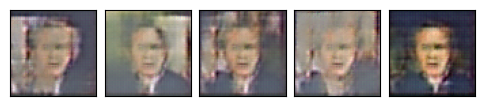

--- EPOCH 80/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 19.37it/s]
Discriminator loss: 0.11917964491381575
Generator loss:     6.933107351189229
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


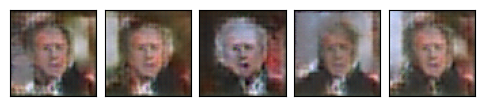

--- EPOCH 81/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 19.19it/s]
Discriminator loss: 0.16397981854405866
Generator loss:     7.051760524066527
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


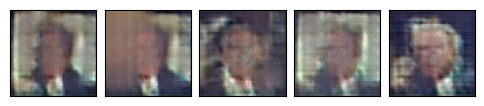

--- EPOCH 82/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 19.17it/s]
Discriminator loss: 0.04885718960370591
Generator loss:     6.737628025795097
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


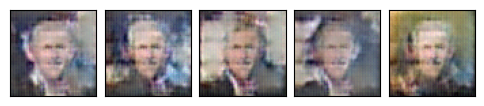

--- EPOCH 83/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 19.42it/s]
Discriminator loss: 0.10705407241831964
Generator loss:     6.042033056714642
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


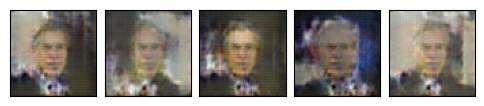

--- EPOCH 84/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 19.73it/s]
Discriminator loss: 0.19579672318563532
Generator loss:     6.988742960033132
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


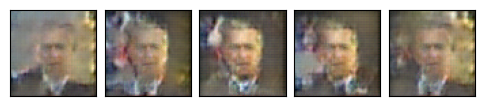

--- EPOCH 85/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 19.94it/s]
Discriminator loss: 0.17543544247746468
Generator loss:     8.415002499053728
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


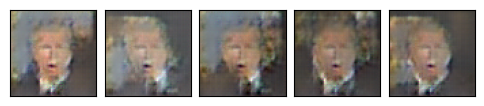

--- EPOCH 86/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 20.13it/s]
Discriminator loss: 0.12615209684443118
Generator loss:     7.313252367190461
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


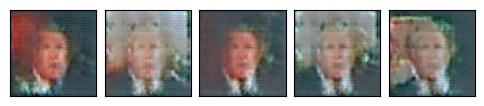

--- EPOCH 87/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 19.41it/s]
Discriminator loss: 0.13415004396394117
Generator loss:     6.912033653970974
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


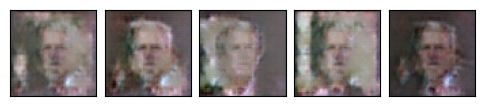

--- EPOCH 88/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 19.52it/s]
Discriminator loss: 0.10639702901244164
Generator loss:     7.198839116452345
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


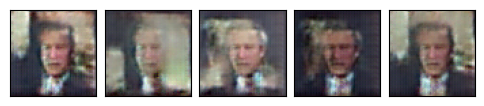

--- EPOCH 89/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 20.02it/s]
Discriminator loss: 0.18888731500995692
Generator loss:     7.875296208395887
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


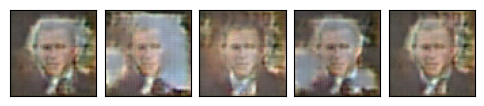

--- EPOCH 90/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 19.76it/s]
Discriminator loss: 0.15291830519242072
Generator loss:     7.59405826454732
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


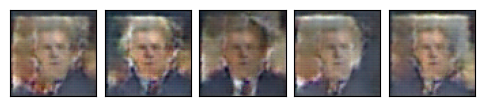

--- EPOCH 91/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 20.17it/s]
Discriminator loss: 0.14948675692526261
Generator loss:     7.7779982588184415
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


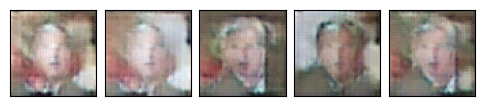

--- EPOCH 92/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 19.71it/s]
Discriminator loss: 0.06283332360213373
Generator loss:     6.660647374480518
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


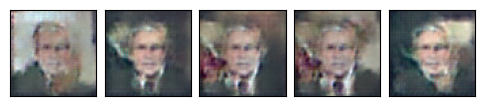

--- EPOCH 93/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 18.29it/s]
Discriminator loss: 0.11359904717598389
Generator loss:     6.9028855259738755
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


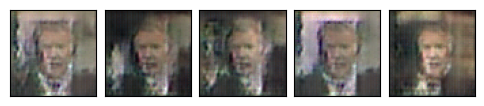

--- EPOCH 94/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 19.15it/s]
Discriminator loss: 0.11983225678107631
Generator loss:     7.708472992057231
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


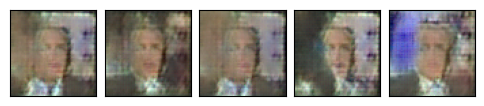

--- EPOCH 95/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 18.77it/s]
Discriminator loss: 0.12177699829326637
Generator loss:     7.433767955694625
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


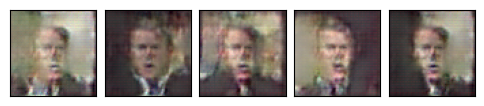

--- EPOCH 96/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 18.72it/s]
Discriminator loss: 0.20978499398525083
Generator loss:     7.909267382835274
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


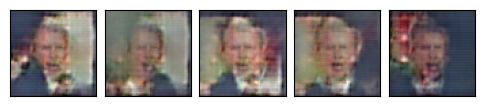

--- EPOCH 97/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 18.73it/s]
Discriminator loss: 0.11841943203958112
Generator loss:     7.658611450622331
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


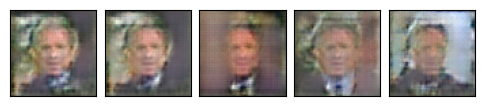

--- EPOCH 98/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 19.34it/s]
Discriminator loss: 0.15690913479497184
Generator loss:     6.254751447421401
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


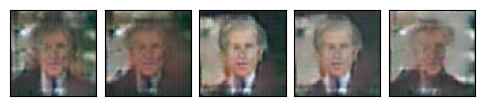

--- EPOCH 99/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 19.97it/s]
Discriminator loss: 0.11587668215828155
Generator loss:     6.329450432933978
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


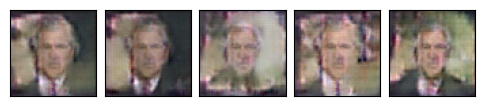

--- EPOCH 100/100 ---
100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [00:03<00:00, 18.92it/s]
Discriminator loss: 0.16338411062511046
Generator loss:     6.1567840576171875
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


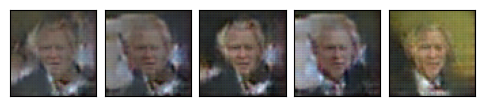

In [12]:
import IPython.display
import tqdm
from hw3.gan import train_batch, save_checkpoint

num_epochs = 100

if os.path.isfile(f'{checkpoint_file_final}.pt'):
    print(f'*** Loading final checkpoint file {checkpoint_file_final} instead of training')
    num_epochs = 0
    gen = torch.load(f'{checkpoint_file_final}.pt', map_location=device)
    checkpoint_file = checkpoint_file_final

try:
    dsc_avg_losses, gen_avg_losses = [], []
    for epoch_idx in range(num_epochs):
        # We'll accumulate batch losses and show an average once per epoch.
        dsc_losses, gen_losses = [], []
        print(f'--- EPOCH {epoch_idx+1}/{num_epochs} ---')

        with tqdm.tqdm(total=len(dl_train.batch_sampler), file=sys.stdout) as pbar:
            for batch_idx, (x_data, _) in enumerate(dl_train):
                x_data = x_data.to(device)
                dsc_loss, gen_loss = train_batch(
                    dsc, gen,
                    dsc_loss_fn, gen_loss_fn,
                    dsc_optimizer, gen_optimizer,
                    x_data)
                dsc_losses.append(dsc_loss)
                gen_losses.append(gen_loss)
                pbar.update()

        dsc_avg_losses.append(np.mean(dsc_losses))
        gen_avg_losses.append(np.mean(gen_losses))
        print(f'Discriminator loss: {dsc_avg_losses[-1]}')
        print(f'Generator loss:     {gen_avg_losses[-1]}')
        
        if save_checkpoint(gen, dsc_avg_losses, gen_avg_losses, checkpoint_file):
            print(f'Saved checkpoint.')
            

        samples = gen.sample(5, with_grad=False)
        fig, _ = plot.tensors_as_images(samples.cpu(), figsize=(6,2))
        IPython.display.display(fig)
        plt.close(fig)
except KeyboardInterrupt as e:
    print('\n *** Training interrupted by user')

*** Images Generated from best model:


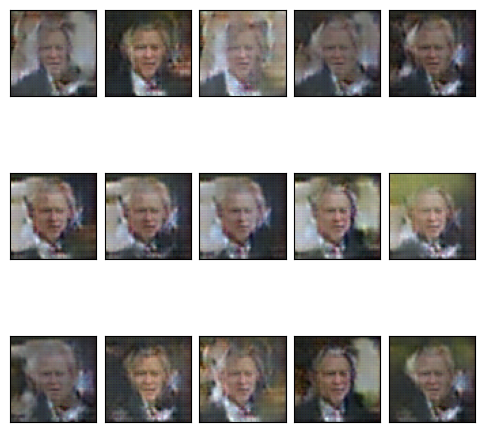

In [13]:
# Plot images from best or last model
if os.path.isfile(f'{checkpoint_file}.pt'):
    gen = torch.load(f'{checkpoint_file}.pt', map_location=device)
print('*** Images Generated from best model:')
samples = gen.sample(n=15, with_grad=False).cpu()
fig, _ = plot.tensors_as_images(samples, nrows=3, figsize=(6,6))

## Questions
<a id=part3_8></a>

**TODO** Answer the following questions. Write your answers in the appropriate variables in the module `hw3/answers.py`.

In [14]:
from cs236781.answers import display_answer
import hw3.answers

### Question 1

Explain in detail why during training we sometimes need to maintain gradients when sampling from the GAN,
and other times we don't. When are they maintained and why? When are they discarded and why?

In [15]:
display_answer(hw3.answers.part3_q1)


**Your answer:**



### Question 2

1. When training a GAN to generate images, should we decide to stop training solely based on the fact that  the Generator loss is below some threshold?
Why or why not?

2. What does it mean if the discriminator loss remains at a constant value while the generator loss decreases?

In [16]:
display_answer(hw3.answers.part3_q2)


**Your answer:**




### Question 3

Compare the results you got when generating images with the VAE to the GAN results.
What's the main difference and what's causing it?

In [17]:
display_answer(hw3.answers.part3_q3)


**Your answer:**



